Plotting for model openl3
and saving them into figures/2d_plots/openl3
model: openl3, perplexity: 3, early_exaggeration: 9


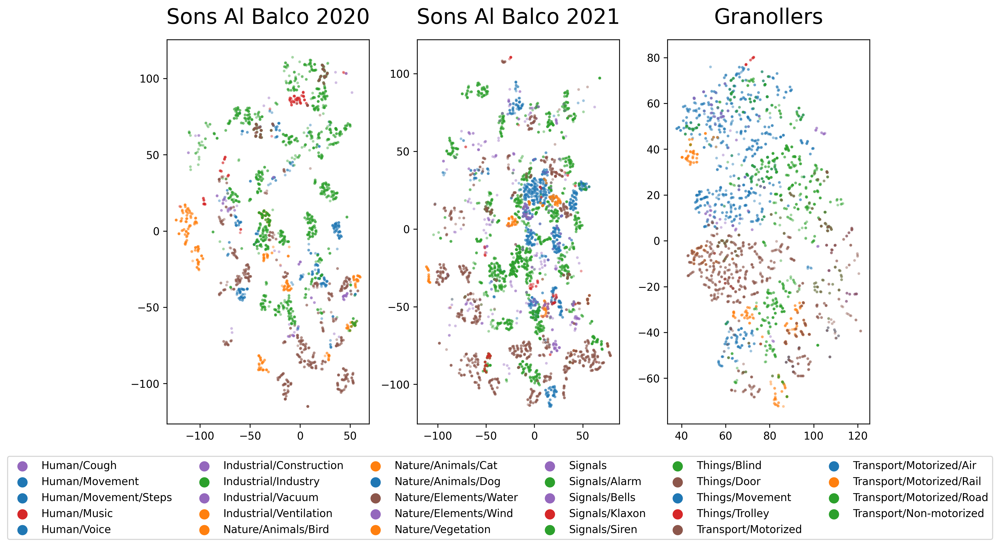

Plotting for model wav2vec
and saving them into figures/2d_plots/wav2vec
model: wav2vec, perplexity: 3, early_exaggeration: 12


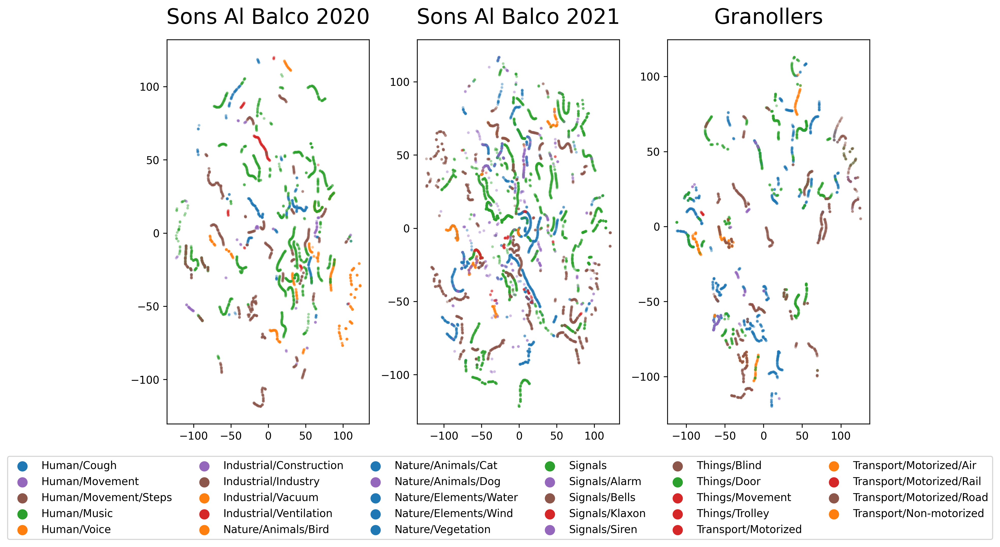

model: wav2vec, perplexity: 6, early_exaggeration: 12


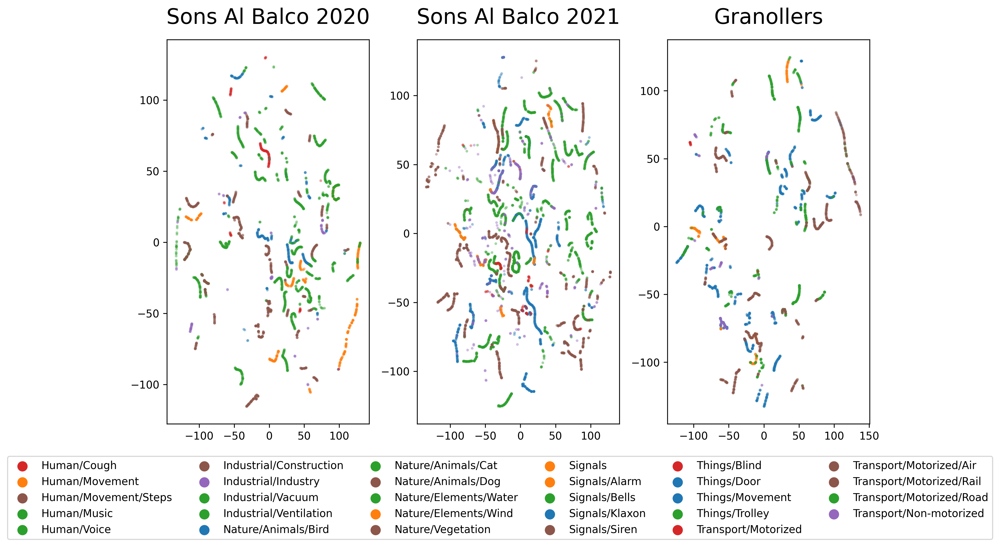

model: wav2vec, perplexity: 9, early_exaggeration: 12


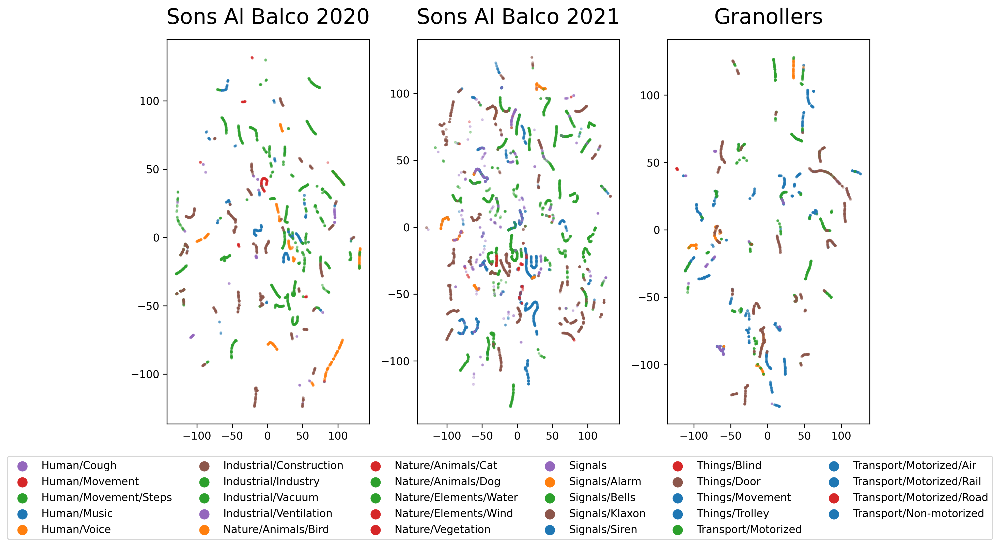

model: wav2vec, perplexity: 15, early_exaggeration: 12


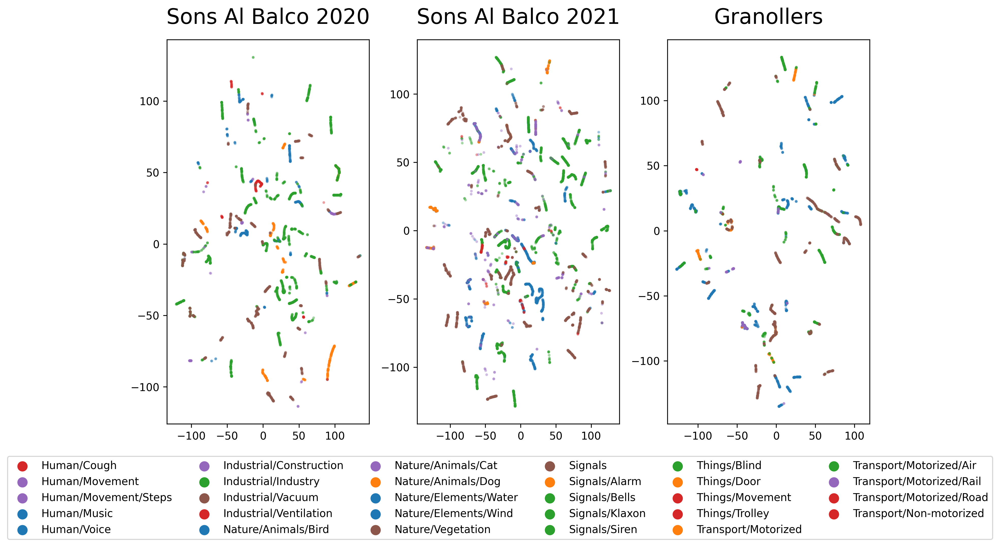

model: wav2vec, perplexity: 40, early_exaggeration: 12


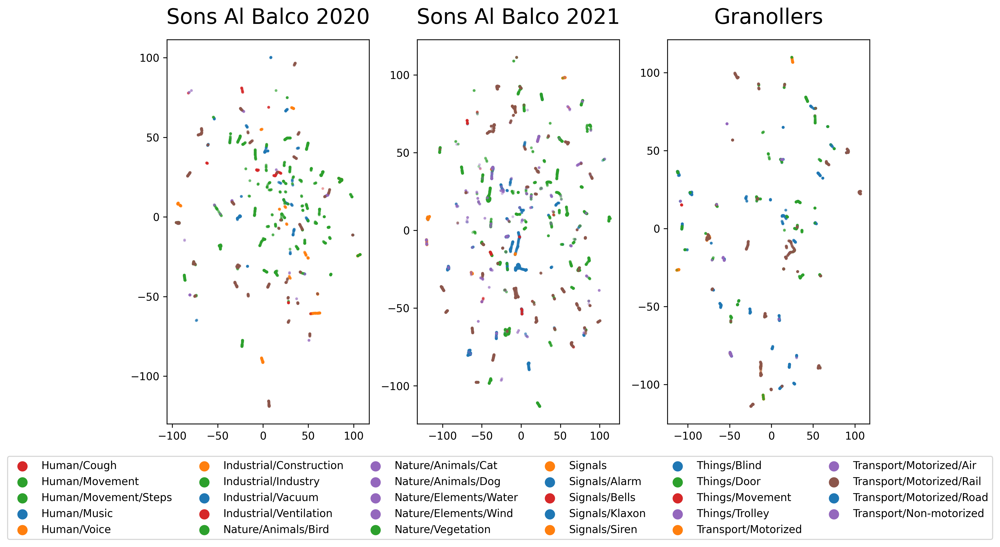

model: wav2vec, perplexity: 60, early_exaggeration: 12


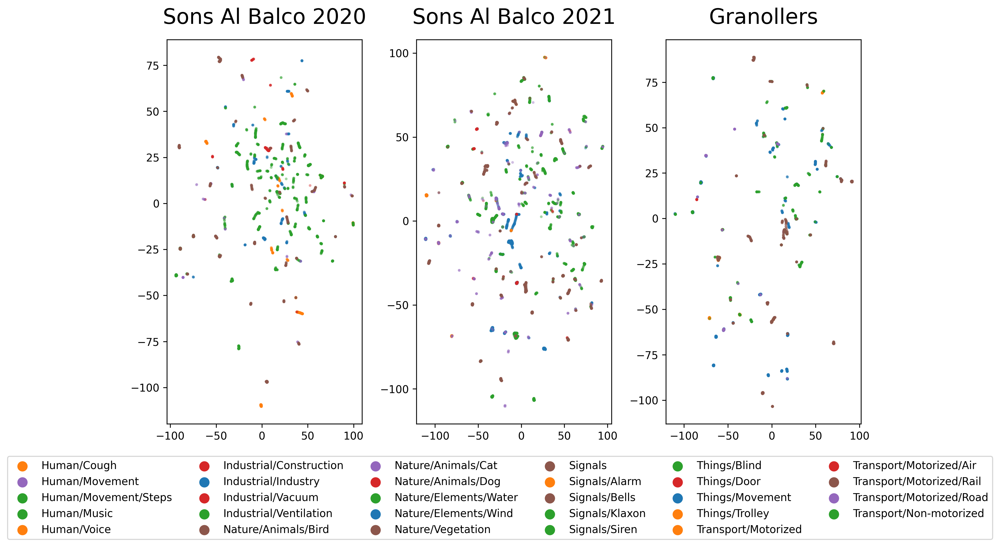

model: wav2vec, perplexity: 80, early_exaggeration: 12


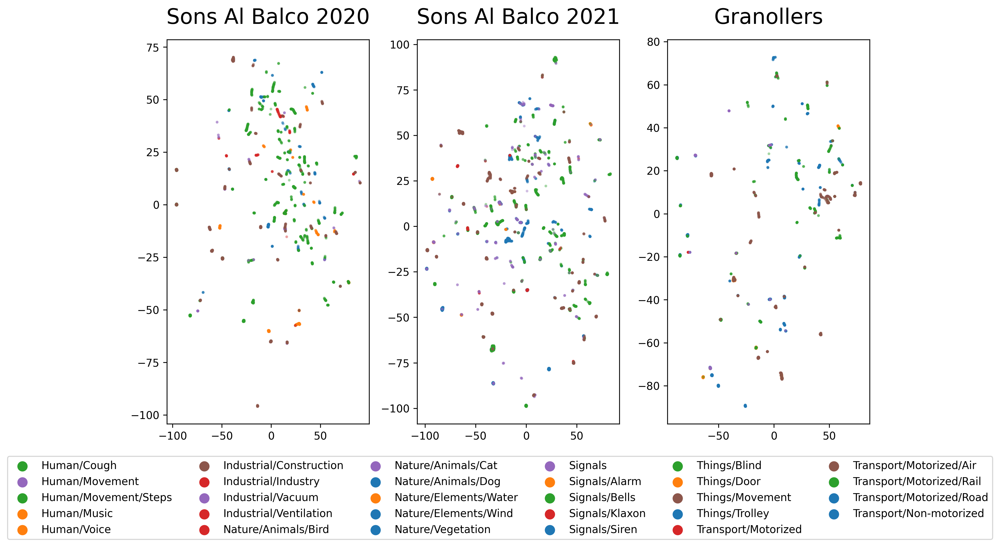

model: wav2vec, perplexity: 100, early_exaggeration: 12


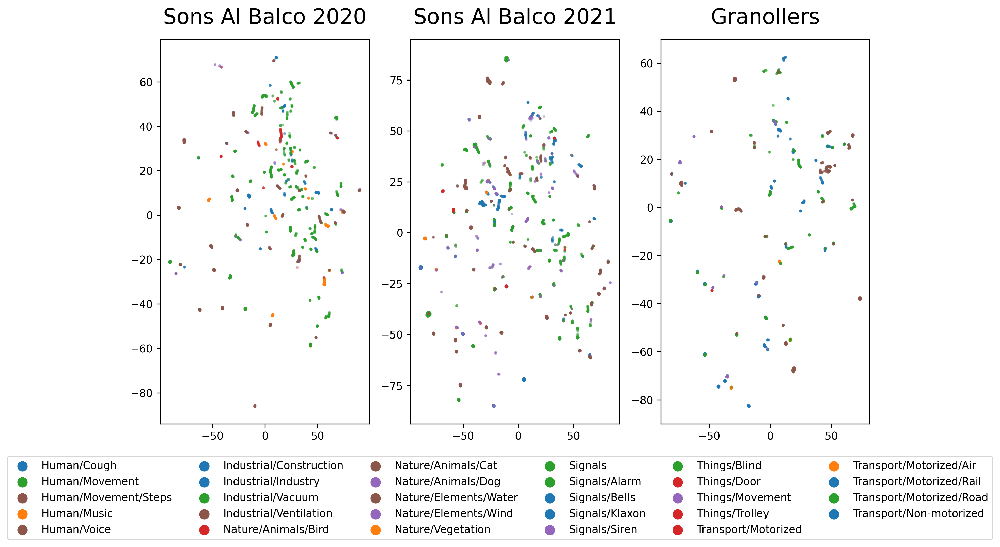

model: wav2vec, perplexity: 130, early_exaggeration: 12


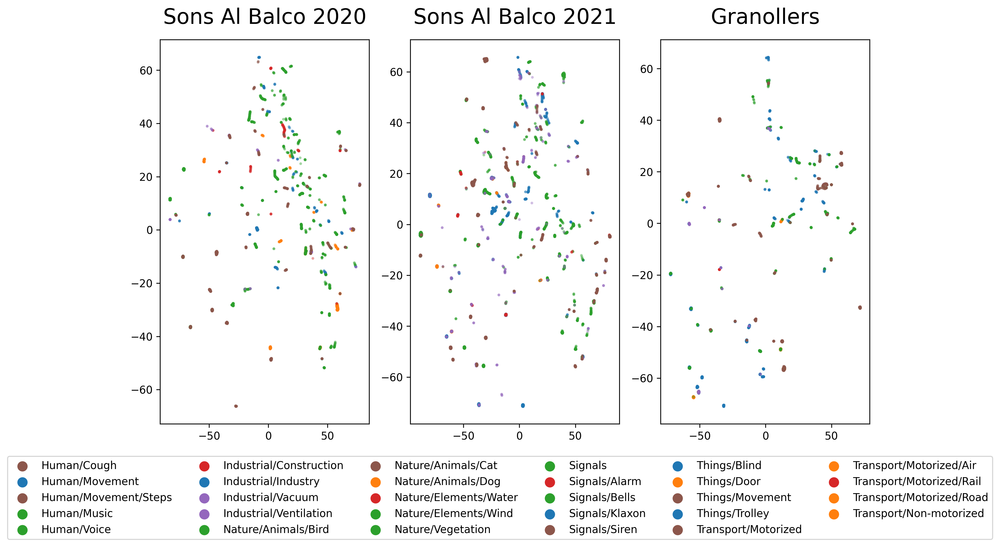

Plotting for model yamnet
and saving them into figures/2d_plots/yamnet
model: yamnet, perplexity: 30, early_exaggeration: 5


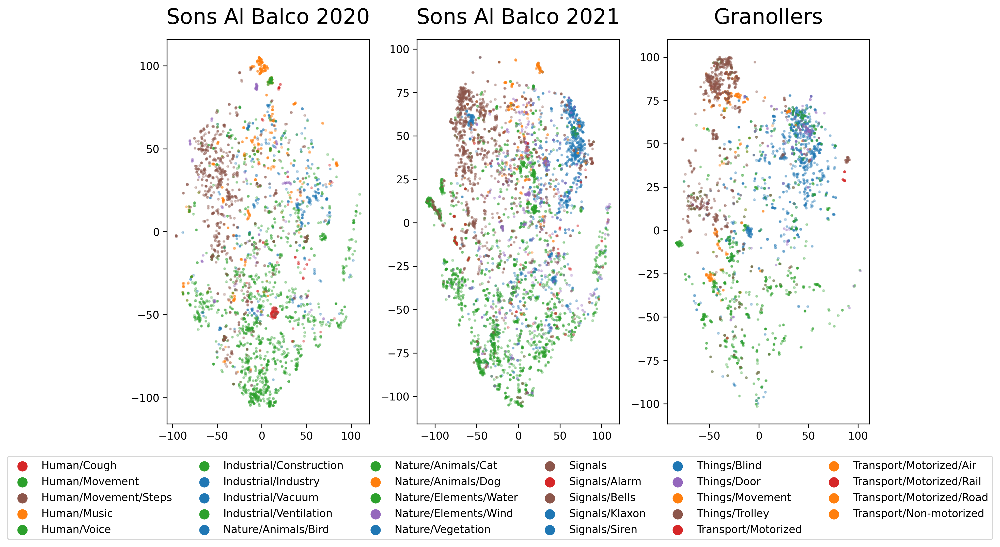

In [3]:
import os
import pickle

import numpy as np
import matplotlib.colors as mcolors
import matplotlib.pyplot as plt

from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import umap

from utils import load_embeddings, load_labels, compute_all_labels, aggregate_embeddings, aggregate_labels

# t-sne parameters
PARAMS_TSNE = {
    "yamnet":{"peplexity": [30], "early_exaggeration": [5]},    # 10,40  20,15  20,40  25,15  25,30
    "openl3":{"peplexity": [3], "early_exaggeration": [9]},
    "wav2vec":{"peplexity": [3, 6, 9, 15, 40, 60, 80, 100, 130], "early_exaggeration": [12]},   # all little worms, make perplexity higher
}

# Define colors for each parent category
parent_colors = {
    'Human': '#1f77b4',
    'Industrial': '#ff7f0e',
    'Nature': '#2ca02c',
    'Signals': '#d62728',
    'Things': '#9467bd',
    'Transport': '#8c564b'
}

# Define subcategory colors with slight variation
sub_colors = {
    'Human/Cough': mcolors.to_hex(mcolors.to_rgba(parent_colors['Human'], alpha=0.6)),
    'Human/Movement': mcolors.to_hex(mcolors.to_rgba(parent_colors['Human'], alpha=0.7)),
    'Human/Movement/Steps': mcolors.to_hex(mcolors.to_rgba(parent_colors['Human'], alpha=0.8)),
    'Human/Music': mcolors.to_hex(mcolors.to_rgba(parent_colors['Human'], alpha=0.9)),
    'Human/Voice': mcolors.to_hex(mcolors.to_rgba(parent_colors['Human'], alpha=1.0)),
    'Industrial/Construction': mcolors.to_hex(mcolors.to_rgba(parent_colors['Industrial'], alpha=0.6)),
    'Industrial/Industry': mcolors.to_hex(mcolors.to_rgba(parent_colors['Industrial'], alpha=0.7)),
    'Industrial/Vacuum': mcolors.to_hex(mcolors.to_rgba(parent_colors['Industrial'], alpha=0.8)),
    'Industrial/Ventilation': mcolors.to_hex(mcolors.to_rgba(parent_colors['Industrial'], alpha=0.9)),
    'Nature/Animals': mcolors.to_hex(mcolors.to_rgba(parent_colors['Nature'], alpha=0.5)),
    'Nature/Animals/Bird': mcolors.to_hex(mcolors.to_rgba(parent_colors['Nature'], alpha=0.6)),
    'Nature/Animals/Cat': mcolors.to_hex(mcolors.to_rgba(parent_colors['Nature'], alpha=0.7)),
    'Nature/Animals/Dog': mcolors.to_hex(mcolors.to_rgba(parent_colors['Nature'], alpha=0.8)),
    'Nature/Elements/Water': mcolors.to_hex(mcolors.to_rgba(parent_colors['Nature'], alpha=0.9)),
    'Nature/Elements/Wind': mcolors.to_hex(mcolors.to_rgba(parent_colors['Nature'], alpha=1.0)),
    'Nature/Vegetation': mcolors.to_hex(mcolors.to_rgba(parent_colors['Nature'], alpha=1.0)),
    'Signals/Alarm': mcolors.to_hex(mcolors.to_rgba(parent_colors['Signals'], alpha=0.6)),
    'Signals/Bells': mcolors.to_hex(mcolors.to_rgba(parent_colors['Signals'], alpha=0.7)),
    'Signals/Klaxon': mcolors.to_hex(mcolors.to_rgba(parent_colors['Signals'], alpha=0.8)),
    'Signals/Siren': mcolors.to_hex(mcolors.to_rgba(parent_colors['Signals'], alpha=0.9)),
    'Things/Blind': mcolors.to_hex(mcolors.to_rgba(parent_colors['Things'], alpha=0.6)),
    'Things/Door': mcolors.to_hex(mcolors.to_rgba(parent_colors['Things'], alpha=0.7)),
    'Things/Movement': mcolors.to_hex(mcolors.to_rgba(parent_colors['Things'], alpha=0.8)),
    'Things/Trolley': mcolors.to_hex(mcolors.to_rgba(parent_colors['Things'], alpha=0.9)),
    'Transport/Motorized': mcolors.to_hex(mcolors.to_rgba(parent_colors['Transport'], alpha=0.6)),
    'Transport/Motorized/Air': mcolors.to_hex(mcolors.to_rgba(parent_colors['Transport'], alpha=0.6)),
    'Transport/Motorized/Rail': mcolors.to_hex(mcolors.to_rgba(parent_colors['Transport'], alpha=0.7)),
    'Transport/Motorized/Road': mcolors.to_hex(mcolors.to_rgba(parent_colors['Transport'], alpha=0.8)),
    'Transport/Non-motorized': mcolors.to_hex(mcolors.to_rgba(parent_colors['Transport'], alpha=0.9))
}


def plot_overall_embeddings(
    data,
    labels,
    idxs,
    datasets,
    all_labels,
    model,
    image_folder,
    size: int = 3,
    alpha: float = 0.3,
    filename: str = "all_datasets",
):
    n_col = len(datasets) // 3 + len(datasets) % 3
    fig, axs = plt.subplots(n_col, 3, figsize=(10, 6), dpi=300)
    axs = axs.flatten()
    for i, dataset in enumerate(datasets):
        start, end = idxs[dataset]
        data_subset = data[start:end]
        lab_list_subset = labels[start:end]

        # select points with at least one label
        # idx = [l_i for l_i, l in enumerate(lab_list_subset) if len(l) > 0]
        # data_subset = data_subset[idx]
        # lab_list_subset = [lab_list_subset[k] for k in idx]
        for lab in all_labels:
            lab_idx = [l_i for l_i, l in enumerate(lab_list_subset) if lab in l]
            if len(lab_idx) == 0:
                continue
            color = sub_colors[lab] if lab in sub_colors else parent_colors[lab]
            axs[i].scatter(
                x=data_subset[lab_idx, 0],
                y=data_subset[lab_idx, 1],
                label=lab,
                color=color,
                s=size,
                alpha=alpha,
            )
        axs[i].set_title(dataset.replace("_", " ").title(), fontsize=20, pad=15)
        #axs[i].set_xticks([])
        #axs[i].set_yticks([])
    handles = []
    labels = []
    for ax in axs:
        h, l = ax.get_legend_handles_labels()
        handles.extend(h)
        labels.extend(l)
    handles = list(set(handles))
    labels = list(set(labels))
    # sort handle and labels according to labels
    labels, handles = zip(*sorted(zip(labels, handles)))
    lgnd = fig.legend(handles, labels, loc="lower center", bbox_to_anchor=(0.5, -0.2), ncol=6, markerscale=5)
    for handle in lgnd.legendHandles:
        handle.set_alpha(1)
    # plt.suptitle(f"{model} embeddings")
    plt.tight_layout()
    model_folder = os.path.join(image_folder, model)
    if not os.path.exists(model_folder):
        os.makedirs(model_folder)
    #plt.savefig(os.path.join(model_folder, f"{filename}.png"), dpi=300, bbox_inches="tight")
    #plt.close()
    plt.show()


IMAGE_FOLDER = "figures/2d_plots"
if not os.path.exists(IMAGE_FOLDER):
    os.makedirs(IMAGE_FOLDER)

DATA_FOLDER: str = "data"
EMB_FOLDER: str = "data/embeddings"

loaded_embeddings = load_embeddings(EMB_FOLDER)
labels = load_labels(DATA_FOLDER)
all_labels = compute_all_labels(labels)

models = loaded_embeddings.keys()
datasets = labels.keys()

# let's modify embeddings to be {model: {dataset: np.array (total_frames, features)}}
# and labels to be {dataset: [list (tot n frames) of lists (labels in frame)]}
loaded_embeddings = aggregate_embeddings(loaded_embeddings)
labels = aggregate_labels(labels)

for model in models:
    image_folder = os.path.join(IMAGE_FOLDER, model)
    if not os.path.exists(image_folder):
        os.makedirs(image_folder)

    print(f"Plotting for model {model}")
    print(f"and saving them into {image_folder}")
    
    # we want a single array for every emb of the model (i.e., for each dataset)
    # and a list of list of labels, w same length as emb.shape[0].
    # Also, to do the plots, we need a dict {dataset: (start_idx, end_idx)}.
    # We will compute it while concatenating the embeddings
    idxs = {}
    start, end = 0, 0
    model_emb = []
    for dataset in datasets:
        e = loaded_embeddings[model][dataset]
        end += e.shape[0]
        idxs[dataset] = (start, end)
        start = end

        model_emb.append(e)
    model_emb = np.concatenate(model_emb)

    model_labels = []
    for dataset in datasets:
        model_labels.extend(labels[dataset])

    pca = PCA(n_components=50)
    pca_data = pca.fit_transform(model_emb)
    # compute tsne
    for perpl in PARAMS_TSNE[model]["peplexity"]:
        for early_ex in PARAMS_TSNE[model]["early_exaggeration"]:
            tsne = TSNE(n_components=2, perplexity=perpl, early_exaggeration=early_ex)
            tsne_data = tsne.fit_transform(pca_data)
            print(f"model: {model}, perplexity: {perpl}, early_exaggeration: {early_ex}")
            plot_overall_embeddings(
                tsne_data, model_labels, idxs, datasets, all_labels, "tsne", image_folder
            )